# Ficzon

# Business case for  PRCL-0019

FicZon Inc is an IT solution provider with products ranging from onpremises products to SAAS based solutions. FicZon major leads generation channel is digital and through their website.  FicZon business is majorly dependent on the sales force effectiveness. As the market is maturing and more new competitors entering the market, FicZon is experiencing the dip in sales.  Effective sales is dependent on lead quality and as of now, this is based on manual categorization and highly depended on sales staff. Though there is a quality process, which continuously updates the lead categorization, it’s value is in for post analysis, rather than conversation. FicZon wants to explore Machine Learning to pre-categorize the lead quality and as result, expecting significant increase in sales effectiveness. 
 
# PROJECT GOAL:
1. Data exploration insights – Sales effectiveness.
2. ML model to predict the Lead Category (High Potential , Low Potential)


# Domain Expertise

- Created - Date and time of lead generated.
- 2. Product_ID - Product id of the each products
- 3. Source - The channel through which a lead initially discovers the company which includes website visits, live chat platforms, referrals, campaigns, and personal contacts. 
- 4. Mobile -Mobile phone number of the customer.
- 5. EMAIL - EmailID of the customer.
- 6. Sales Agent - A person or a company that acts as a sales agent on behalf of the company, introducing its products to the leads.
- Location - Locations of the leads.
- Delivery_Mode - Mode of the delivery according to the location.
- Status - (The target variable) The field is typically used to communicate the status of a record to both the reporting users and the sales rep who is working the lead. The reporting user wants to see explicit detail while the sales rep wants to update the record in a natural and efficient manner.

# Importing Libraries

In [1]:
import mysql.connector
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import OneHotEncoder,LabelBinarizer
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,f1_score,roc_auc_score,precision_score,recall_score
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from imblearn.over_sampling import ADASYN,SMOTE
from xgboost import XGBClassifier


# Loading data

In [2]:
mydb = mysql.connector.connect(
  host="18.136.157.135",
  port="3306",
  user="dm_team2",
  password="DM!$Team&27@9!20!"
)

In [3]:
mycursor = mydb.cursor()

In [4]:
mycursor.execute("SHOW DATABASES")
databases = [db[0] for db in mycursor.fetchall()]
print("Available databases:", databases)

Available databases: ['information_schema', 'project_sales']


In [5]:
database_name = "project_sales"
mycursor.execute(f"USE {database_name}")
mycursor.execute("SHOW TABLES")
tables = [table[0] for table in mycursor.fetchall()]
print(f"Tables in {database_name} database:", tables)

Tables in project_sales database: ['data']


In [6]:
database_name = "project_sales"
mycursor.execute(f"USE {database_name}")
mycursor.execute("select * from data")
df = pd.DataFrame(mycursor.fetchall(), columns=[col[0] for col in mycursor.description])

In [7]:
df.to_csv("project_sales.csv")

## Basic checks

In [8]:
df

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
0,14-11-2018 10:05,,Website,984XXXXXXX,aXXXXXXX@gmail.com,Sales-Agent-11,,Mode-5,Open
1,14-11-2018 09:22,,Website,XXXXXXX,#VALUE!,Sales-Agent-10,,Mode-5,Open
2,14-11-2018 09:21,,Website,XXXXXXX,dXXXXXXX@yahoo.com,Sales-Agent-10,,Mode-5,Open
3,14-11-2018 08:46,,Website,XXXXXXX,wXXXXXXX@gmail.com,Sales-Agent-10,,Mode-5,Open
4,14-11-2018 07:34,,Website,XXXXXXX,cXXXXXXX@gmail.com,Sales-Agent-10,,Mode-5,Open
...,...,...,...,...,...,...,...,...,...
7417,28-04-2018 09:45,9,Call,,aXXXXXXX@gmail.com,Sales-Agent-6,Mumbai,Mode-4,LOST
7418,28-04-2018 09:43,15,Call,,#VALUE!,Sales-Agent-12,Other Locations,Mode-5,LOST
7419,28-04-2018 09:20,5,Live Chat-Direct,,sXXXXXXX@gmail.com,Sales-Agent-11,Bangalore,Mode-1,Not Responding
7420,28-04-2018 08:04,21,CRM form,,YXXXXXXX@gmail.com,Sales-Agent-4,Other Locations,Mode-1,Just Enquiry


In [9]:
df.head()

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
0,14-11-2018 10:05,,Website,984XXXXXXX,aXXXXXXX@gmail.com,Sales-Agent-11,,Mode-5,Open
1,14-11-2018 09:22,,Website,XXXXXXX,#VALUE!,Sales-Agent-10,,Mode-5,Open
2,14-11-2018 09:21,,Website,XXXXXXX,dXXXXXXX@yahoo.com,Sales-Agent-10,,Mode-5,Open
3,14-11-2018 08:46,,Website,XXXXXXX,wXXXXXXX@gmail.com,Sales-Agent-10,,Mode-5,Open
4,14-11-2018 07:34,,Website,XXXXXXX,cXXXXXXX@gmail.com,Sales-Agent-10,,Mode-5,Open


In [10]:
df.tail()

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
7417,28-04-2018 09:45,9,Call,,aXXXXXXX@gmail.com,Sales-Agent-6,Mumbai,Mode-4,LOST
7418,28-04-2018 09:43,15,Call,,#VALUE!,Sales-Agent-12,Other Locations,Mode-5,LOST
7419,28-04-2018 09:20,5,Live Chat-Direct,,sXXXXXXX@gmail.com,Sales-Agent-11,Bangalore,Mode-1,Not Responding
7420,28-04-2018 08:04,21,CRM form,,YXXXXXXX@gmail.com,Sales-Agent-4,Other Locations,Mode-1,Just Enquiry
7421,28-04-2018 07:54,25,Website,,cXXXXXXX@gmail.com,Sales-Agent-3,Chennai,Mode-1,CONVERTED


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7422 entries, 0 to 7421
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Created        7422 non-null   object
 1   Product_ID     7422 non-null   object
 2   Source         7422 non-null   object
 3   Mobile         7422 non-null   object
 4   EMAIL          7422 non-null   object
 5   Sales_Agent    7422 non-null   object
 6   Location       7422 non-null   object
 7   Delivery_Mode  7422 non-null   object
 8   Status         7422 non-null   object
dtypes: object(9)
memory usage: 522.0+ KB


In [12]:
df.describe()

,Created,Product_ID,Source,Mobile,EMAIL,Sales_Agent,Location,Delivery_Mode,Status
count,7422,7422,7422,7422,7422,7422,7422,7422,7422
unique,6752,30,26,487,883,13,18,5,11
top,26-09-2018 11:30,18,Call,,#VALUE!,Sales-Agent-4,Other Locations,Mode-5,Junk Lead
freq,4,1711,2547,1810,1701,1500,2500,2975,1536


In [13]:
df.Delivery_Mode.value_counts()

Delivery_Mode
Mode-5    2975
Mode-1    2627
Mode-3    1688
Mode-4     121
Mode-2      11
Name: count, dtype: int64

In [14]:
df.Delivery_Mode.value_counts()

Delivery_Mode
Mode-5    2975
Mode-1    2627
Mode-3    1688
Mode-4     121
Mode-2      11
Name: count, dtype: int64

In [15]:
df.shape

(7422, 9)

In [16]:
df.isnull().sum()

Created          0
Product_ID       0
Source           0
Mobile           0
EMAIL            0
Sales_Agent      0
Location         0
Delivery_Mode    0
Status           0
dtype: int64

In [17]:
df.replace('',np.nan,inplace=True)

In [18]:
df.replace('#VALUE!',np.nan,inplace=True)

In [19]:
df.isnull().sum()

Created             0
Product_ID         58
Source             17
Mobile           1810
EMAIL            1701
Sales_Agent        23
Location           58
Delivery_Mode       0
Status              0
dtype: int64

In [20]:
df.drop(['Mobile','EMAIL'],axis = 1,inplace = True)

In [21]:
df.isnull().sum()

Created           0
Product_ID       58
Source           17
Sales_Agent      23
Location         58
Delivery_Mode     0
Status            0
dtype: int64

In [22]:
df.dropna(inplace=True)

In [23]:
df.isnull().sum()

Created          0
Product_ID       0
Source           0
Sales_Agent      0
Location         0
Delivery_Mode    0
Status           0
dtype: int64

In [24]:
df.nunique()

Created          6667
Product_ID         29
Source             25
Sales_Agent        11
Location           17
Delivery_Mode       5
Status             11
dtype: int64

## Value Counts

In [25]:
print(df['Status'].value_counts())

Status
Junk Lead               1532
Not Responding          1119
CONVERTED                834
Just Enquiry             751
Potential                705
Long Term                644
In Progress Positive     642
In Progress Negative     625
LOST                     439
Open                      19
converted                 18
Name: count, dtype: int64


In [26]:
df.duplicated().sum()

9

In [27]:
df.Location.value_counts()

Location
Other Locations    2481
Bangalore          2079
Chennai             907
Hyderabad           527
Delhi               470
Mumbai              399
Pune                139
UAE                  77
Trivandrum           58
Kolkata              55
USA                  45
UK                   41
AUSTRALIA            25
Singapore            17
Malaysia              4
EUROPE                3
Howrah                1
Name: count, dtype: int64

In [28]:
df.Product_ID.value_counts()

Product_ID
18    1706
15    1501
19    1188
9      990
27     737
5      484
10     168
1      104
20     101
25      90
21      65
2       38
12      36
26      31
14      27
11      12
22       8
3        7
6        7
8        6
17       6
13       4
16       3
24       2
23       2
0        2
28       1
7        1
4        1
Name: count, dtype: int64

In [29]:
df.Source.value_counts()

Source
Call                             2536
Live Chat-Direct                 1827
Website                          1551
Live Chat-Google Organic          269
Live Chat -PPC                    249
Live Chat-Blog                    237
Customer Referral                 180
US Website                        129
Just Dial                          56
Existing Client                    51
Personal Contact                   50
Live Chat-CPC                      49
By Recommendation                  32
Existing Customer                  22
CRM form                           22
Live Chat-Google Ads               20
Campaign                           19
E-mail Campaign                    12
Live Chat-Adwords Remarketing       7
Live Chat-Quora                     2
Other                               2
SMS Campaign                        2
Live Chat-Youtube                   2
E-Mail Message                      1
Live Chat-Justdial                  1
Name: count, dtype: int64

In [30]:
df.Sales_Agent.value_counts()

Sales_Agent
Sales-Agent-4     1495
Sales-Agent-11    1414
Sales-Agent-5     1182
Sales-Agent-9      878
Sales-Agent-3      780
Sales-Agent-7      734
Sales-Agent-2      389
Sales-Agent-12     269
Sales-Agent-6      114
Sales-Agent-8       68
Sales-Agent-10       5
Name: count, dtype: int64

In [31]:
df.Delivery_Mode.value_counts()

Delivery_Mode
Mode-5    2903
Mode-1    2614
Mode-3    1681
Mode-4     120
Mode-2      10
Name: count, dtype: int64

In [32]:
# Defining 'Status' as 'High Potential' or 'Poor Potential' as per the requirements from the client
df.Status.replace(['CONVERTED','converted','In Progress Positive','Potential','Long Term','Open'],'High Potential',inplace=True)
df.Status.replace(['LOST','In Progress Negative','Not Responding','Junk Lead','Just Enquiry'],'Low Potential',inplace=True)

In [33]:
df.Status.value_counts()

Status
Low Potential     4466
High Potential    2862
Name: count, dtype: int64

In [34]:
#changing Created column dtype from object to datetime format
df['Created']=pd.to_datetime(df['Created'])

#changing dates into seperate column
df['Created_day']=df['Created'].dt.day.astype('int64')
df['Created_month']=df['Created'].dt.month.astype(np.int64)
df['Created_year']=df['Created'].dt.year.astype(np.int64)

#changing time into seperate column
df['Created_hour']=df['Created'].dt.hour.astype(np.int64)
df['Created_minute']=df['Created'].dt.minute.astype(np.int64)

In [35]:
df

,Created,Product_ID,Source,Sales_Agent,Location,Delivery_Mode,Status,Created_day,Created_month,Created_year,Created_hour,Created_minute
18,2018-11-13 18:51:00,9,Live Chat-Google Organic,Sales-Agent-3,Bangalore,Mode-1,High Potential,13,11,2018,18,51
19,2018-11-13 18:48:00,19,Call,Sales-Agent-4,Other Locations,Mode-5,High Potential,13,11,2018,18,48
24,2018-11-13 17:09:00,18,Website,Sales-Agent-11,Trivandrum,Mode-1,High Potential,13,11,2018,17,9
25,2018-11-13 16:49:00,15,Website,Sales-Agent-7,Hyderabad,Mode-1,Low Potential,13,11,2018,16,49
26,2018-11-13 16:37:00,18,Call,Sales-Agent-7,Bangalore,Mode-1,High Potential,13,11,2018,16,37
...,...,...,...,...,...,...,...,...,...,...,...,...
7417,2018-04-28 09:45:00,9,Call,Sales-Agent-6,Mumbai,Mode-4,Low Potential,28,4,2018,9,45
7418,2018-04-28 09:43:00,15,Call,Sales-Agent-12,Other Locations,Mode-5,Low Potential,28,4,2018,9,43
7419,2018-04-28 09:20:00,5,Live Chat-Direct,Sales-Agent-11,Bangalore,Mode-1,Low Potential,28,4,2018,9,20
7420,2018-04-28 08:04:00,21,CRM form,Sales-Agent-4,Other Locations,Mode-1,Low Potential,28,4,2018,8,4


In [36]:
df.drop(['Created_year'],axis=1,inplace=True)

## Univariate Analysis

In [37]:
import sweetviz as sv
my_report = sv.analyze(df)
my_report.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### INSIGHTS
- Most frequently showed Product_Id is 18 which means it is high in demand and least is 22 .
- Top category from Source is call and Live Chat_Direct. and Campaign shows least impact.
- Sales-Agent-4 and Sales-Agent-11 does the most of the sales and least is done by Sales-Agent-1.
- Top category is Other location followed by Bangalore.
- Delivery_mode 5 is most choosen one by the customers and least is Mode-2.
- The dataset have status as high and low potential leads is equally distributed

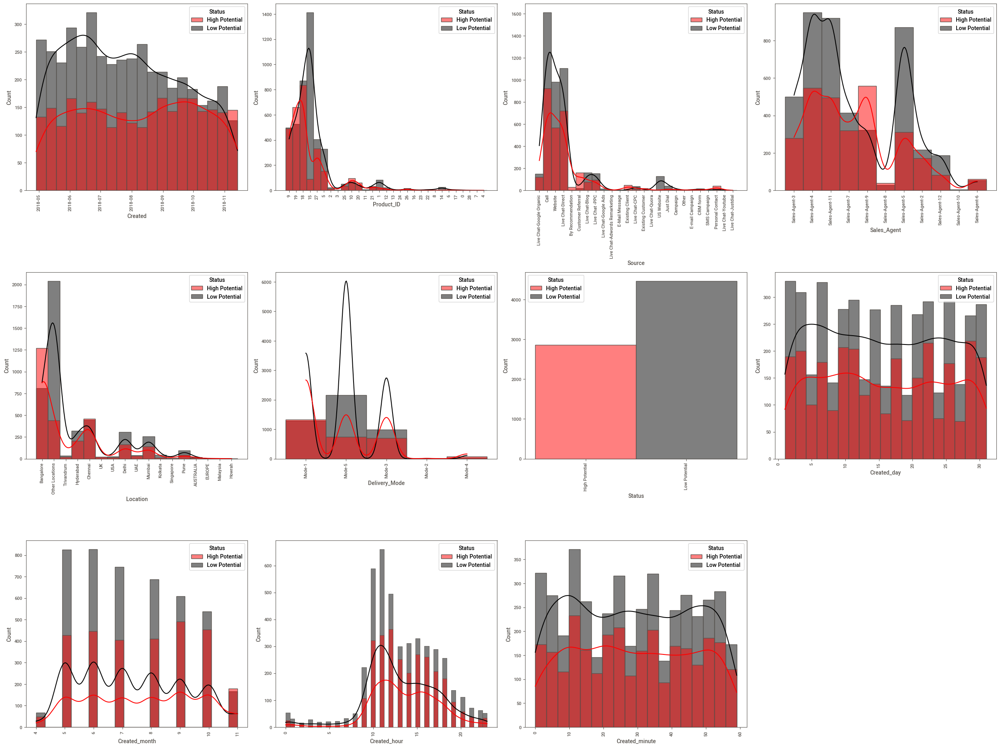

In [38]:
plt.figure(figsize=(25,25))
p=1
for i in df:
    ax = plt.subplot(4,4,p)
    sns.histplot(x = df[i],kde = True,hue=df.Status,palette=['Red','Black'])
    plt.xticks(rotation=90)
    p+=1
plt.tight_layout()

## Bivariate Analysis

In [39]:
# plotting a countplot on df
plt.figure(figsize=(100, 100), facecolor="white")
p = 1

for column in df:
    if p <= 6:
        ax = plt.subplot(3, 2, p)
        sns.countplot(x=df[column], hue=df["Status"])
        plt.xlabel(column, fontsize=100)
        plt.ylabel("Status", fontsize=100)
        plt.legend(fontsize=50)
        plt.xticks(fontsize=50,rotation='vertical')
        plt.yticks(fontsize=50)

        # Add values to the countplot
        for rect in ax.patches:
            height = rect.get_height()
            ax.text(rect.get_x() + rect.get_width() / 2, height, f"{int(height)}", ha="center", va="bottom", fontsize=30)

    p += 1

plt.tight_layout()
plt.show()
plt.show()

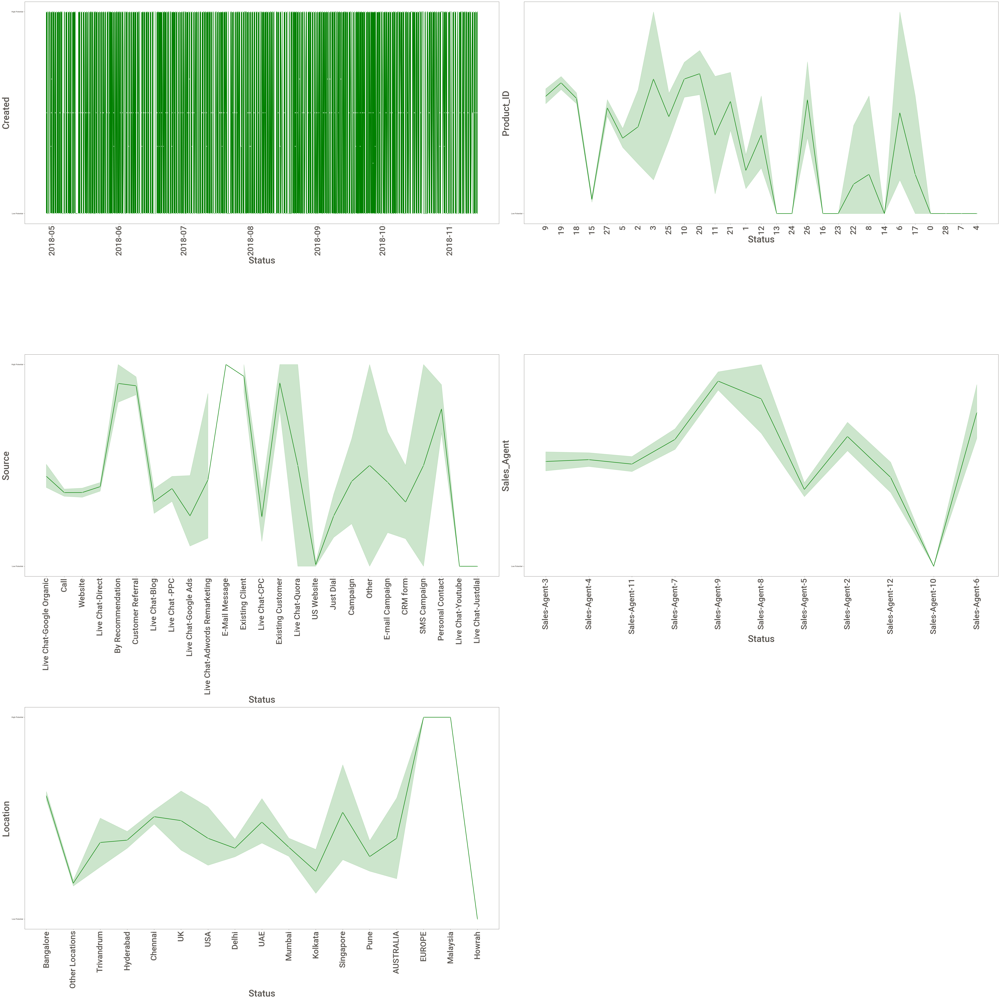

In [40]:
# plotting a lineplot on df
plt.figure(figsize=(60, 60), facecolor="white")
p = 1

for column in df.iloc[:,:5]:
    if(p<=6):
        ax=plt.subplot(3,2,p)
        sns.lineplot(x=df[column], y='Status', data=df, color='Green', marker='o', linewidth=2)
        plt.xlabel('Status',fontsize=40)
        plt.ylabel(column,fontsize=40)    
        plt.xticks(rotation=90, fontsize=35)
    p+=1
plt.tight_layout() 

<function matplotlib.pyplot.tight_layout(*, pad: 'float' = 1.08, h_pad: 'float | None' = None, w_pad: 'float | None' = None, rect: 'tuple[float, float, float, float] | None' = None) -> 'None'>

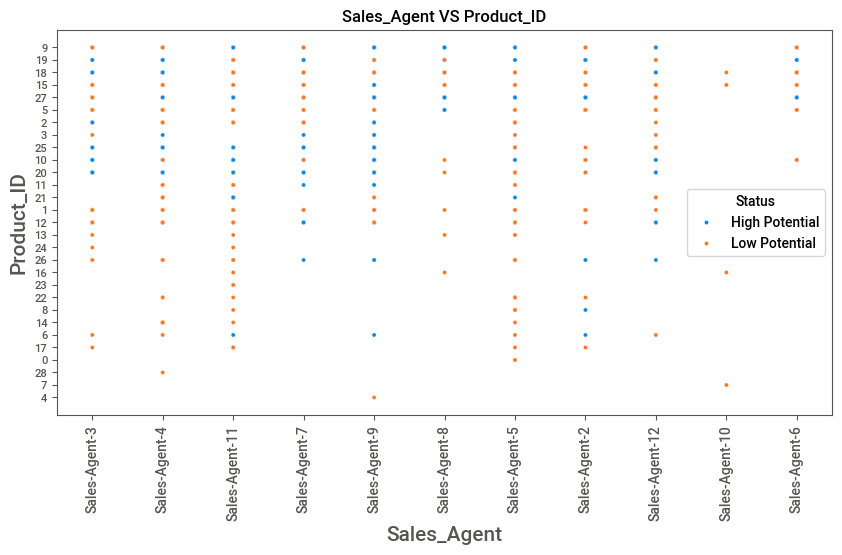

In [41]:
# plotting scatter on Sales_Agent and Product_ID
plt.figure(figsize=(10,5))
sns.scatterplot(x="Sales_Agent",y="Product_ID",hue='Status',data=df)
plt.title("Sales_Agent VS Product_ID")
plt.xlabel("Sales_Agent",fontsize=15)
plt.ylabel("Product_ID",fontsize=15)    
plt.xticks(rotation=90, fontsize=10)
plt.tight_layout

### INSIGHTS
- Sales_Agent 4,11,5 are the top three agents
- Sales_agent 5 have the most high potential status , followed by 4 and 11

<function matplotlib.pyplot.tight_layout(*, pad: 'float' = 1.08, h_pad: 'float | None' = None, w_pad: 'float | None' = None, rect: 'tuple[float, float, float, float] | None' = None) -> 'None'>

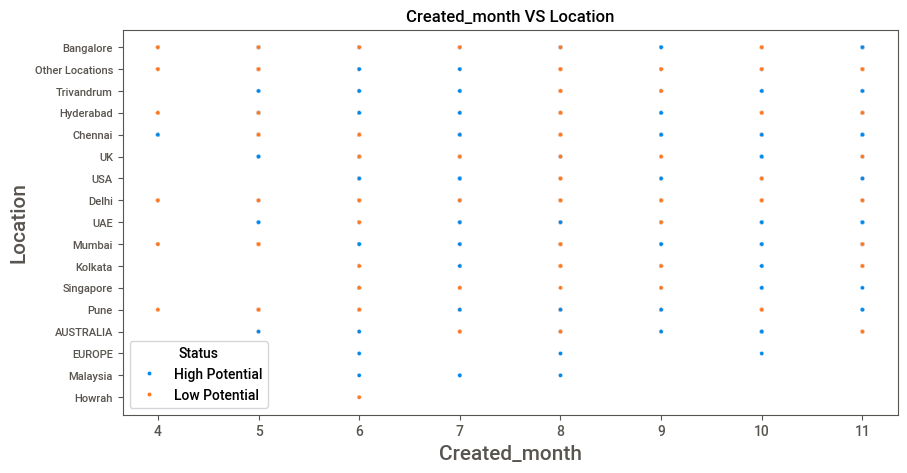

In [42]:
# plotting scatter on Created_month and Location
plt.figure(figsize=(10,5))
sns.scatterplot(x="Created_month",y="Location",hue='Status',data=df)
plt.title("Created_month VS Location")
plt.xlabel("Created_month",fontsize=15)
plt.ylabel("Location",fontsize=15)    
plt.xticks(rotation=0, fontsize=10)
plt.tight_layout

## INSIGHTS
- On the month of June(06) , they had sales on every location 
- Hyderabad have the best high potential delivery followed by Chennai and Mumbai

<function matplotlib.pyplot.tight_layout(*, pad: 'float' = 1.08, h_pad: 'float | None' = None, w_pad: 'float | None' = None, rect: 'tuple[float, float, float, float] | None' = None) -> 'None'>

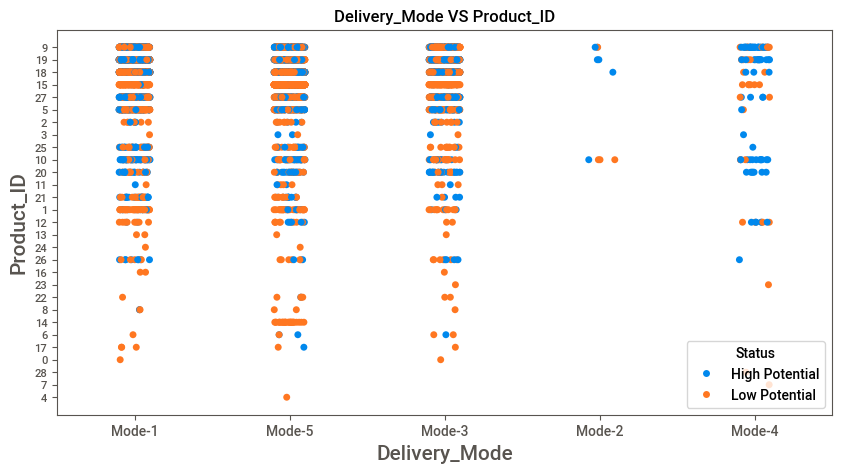

In [43]:
# plotting strip on Delivery_Mode and Product_ID
plt.figure(figsize=(10,5))
sns.stripplot(x="Delivery_Mode",y="Product_ID",hue='Status',data=df)
plt.title("Delivery_Mode VS Product_ID")
plt.xlabel("Delivery_Mode",fontsize=15)
plt.ylabel("Product_ID",fontsize=15)    
plt.xticks(rotation=0, fontsize=10)
plt.tight_layout

## INSIGHT
- Mode 5,1,3 were used frequently for delivery
- Mode 2 doesn't using that much 
- Mode 1 have high potential delivaries followed by 3,5

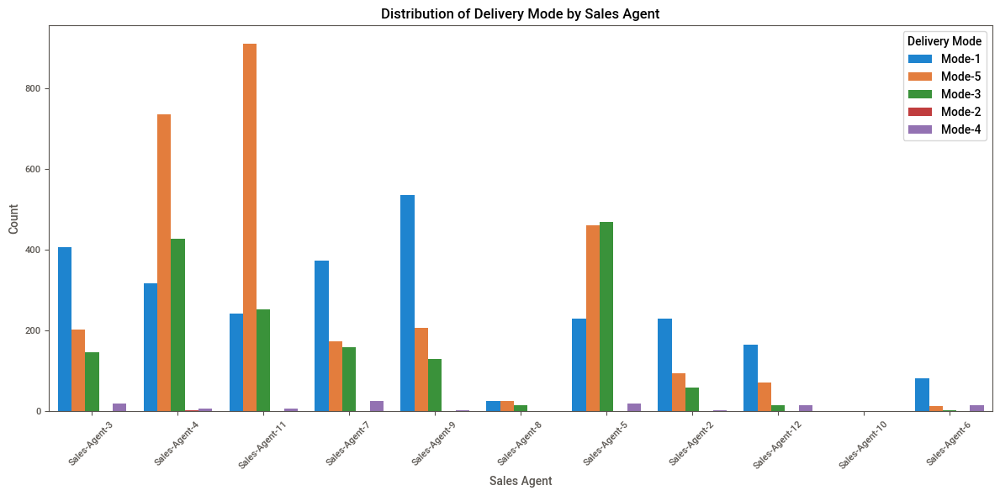

In [44]:
# plotting Distribution of Delivery Mode by Sales Agent
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='Sales_Agent', hue='Delivery_Mode')
plt.title('Distribution of Delivery Mode by Sales Agent')
plt.xlabel('Sales Agent')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Delivery Mode')
plt.tight_layout()
plt.show()

## INSIGHT
- Sales Agents 11,4,5 are the top most agent, which they use mode-5 for delivery
- Delivery mode 3 and 1 also using by agents

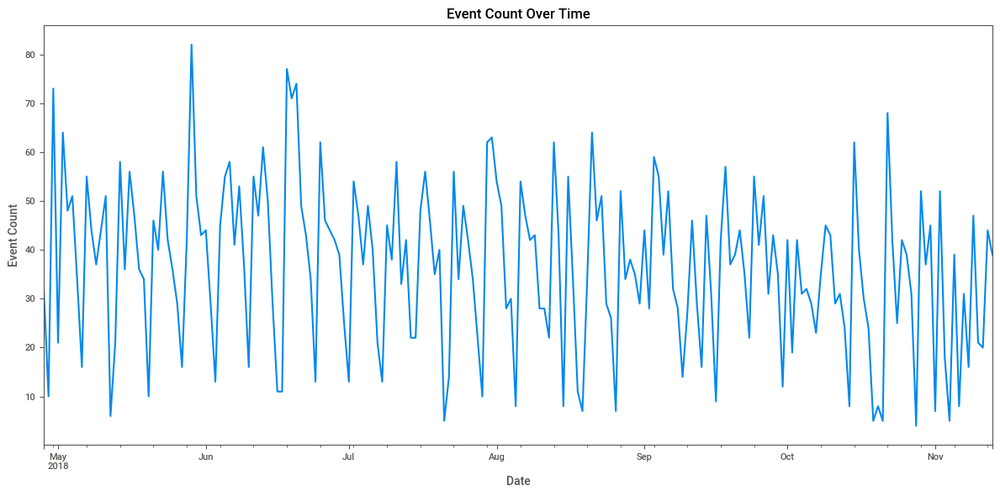

In [45]:
# showing the Event Count Over Time
plt.figure(figsize=(12, 6))
df['Created'] = pd.to_datetime(df['Created'])  
df.resample('D', on='Created').size().plot()  # Resample by day and plot
plt.title('Event Count Over Time')
plt.xlabel('Date')
plt.ylabel('Event Count')
plt.tight_layout()
plt.show()

## INSIGHT
- Even the distribution have lots of various, the growth is normal

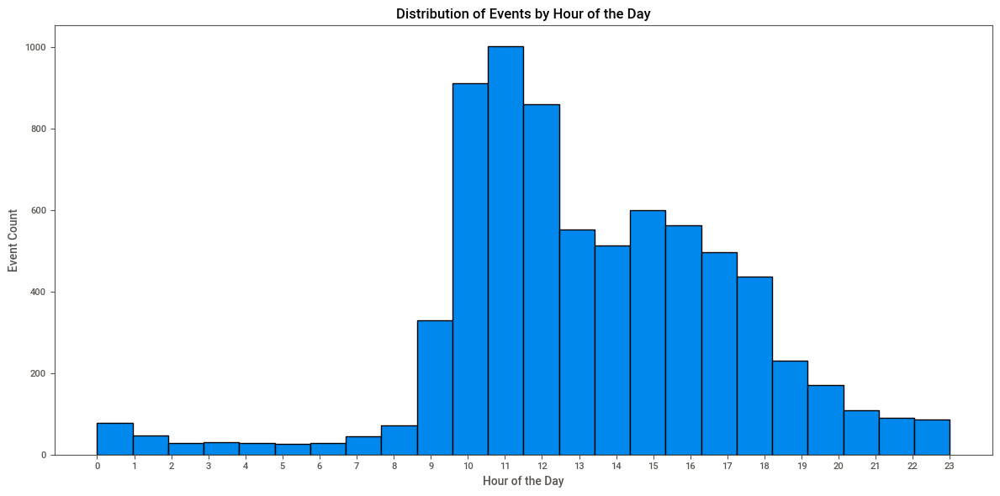

In [46]:
# plotting Distribution of Events by Hour of the Day
plt.figure(figsize=(12, 6))
df['Hour'] = df['Created'].dt.hour  # Extract hour from 'Created' column
plt.hist(df['Hour'], bins=24, edgecolor='black')
plt.title('Distribution of Events by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Event Count')
plt.xticks(range(24))
plt.tight_layout()
plt.show()

## INSIGHT
-  Most of the delivery happens in the time range of 10 to 12

In [47]:
import plotly.express as px

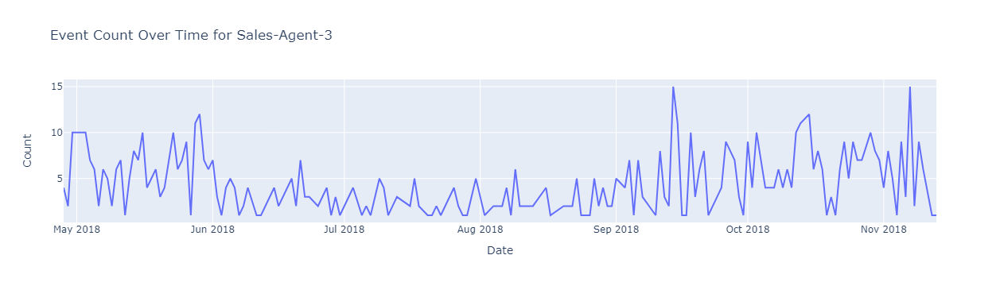

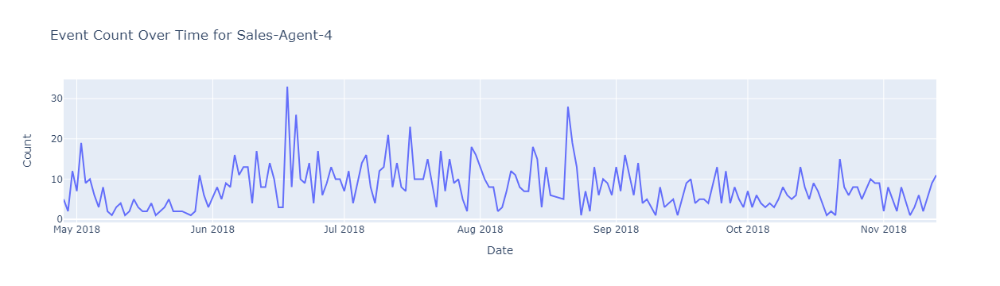

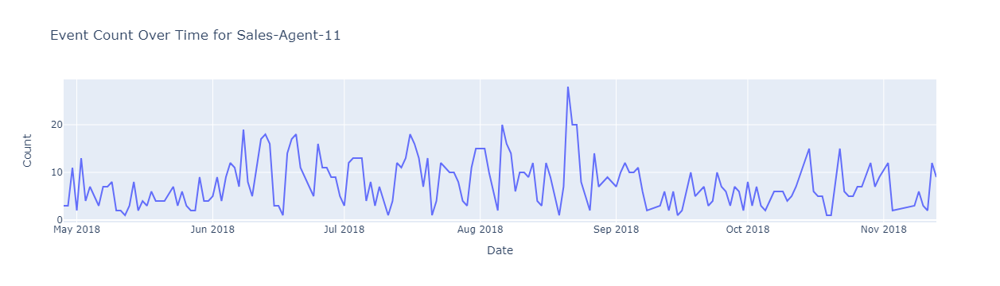

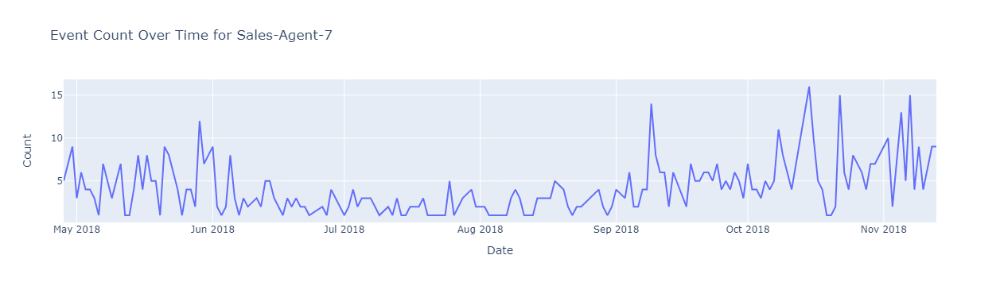

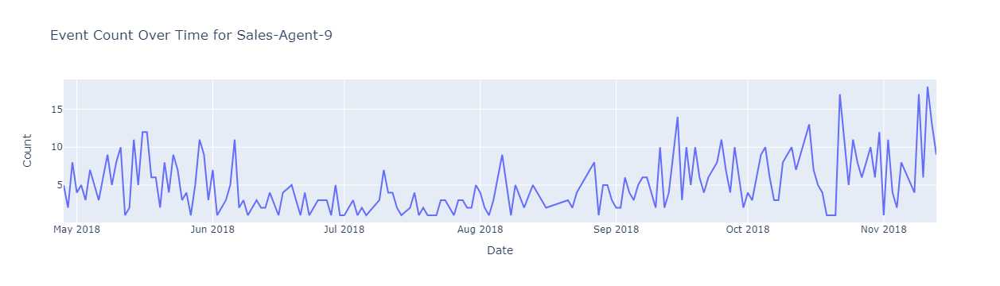

...

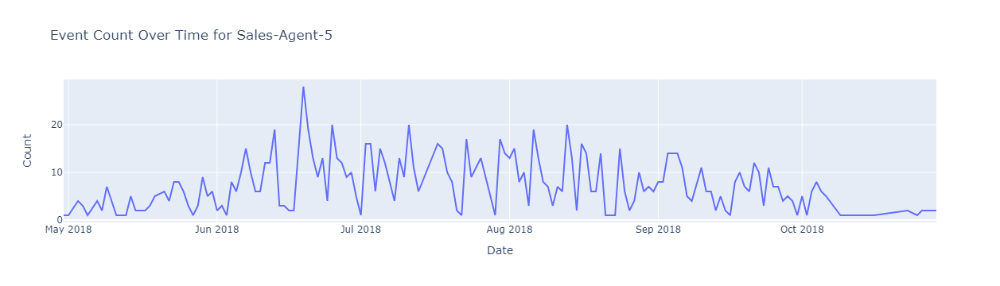

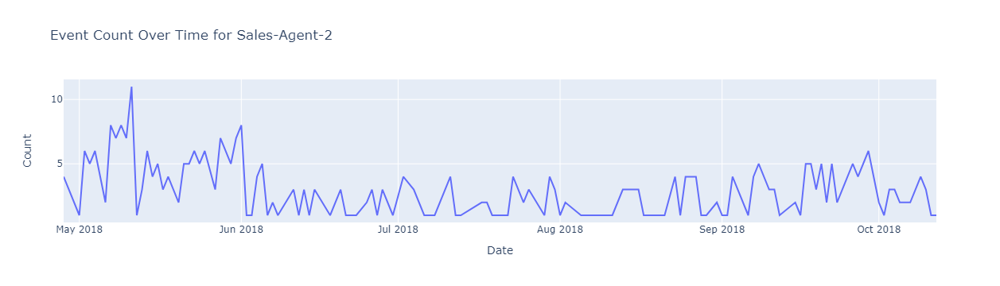

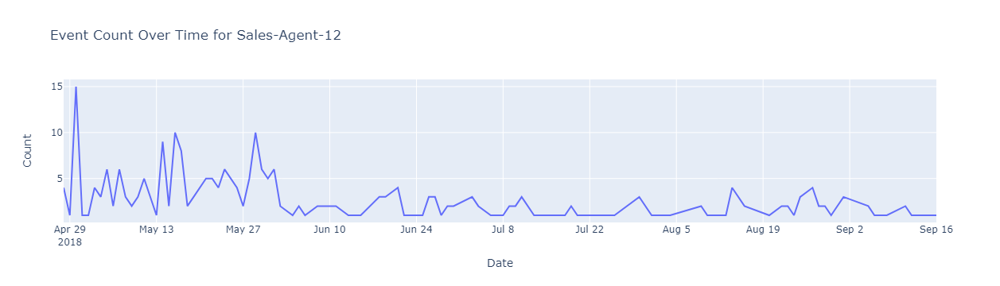

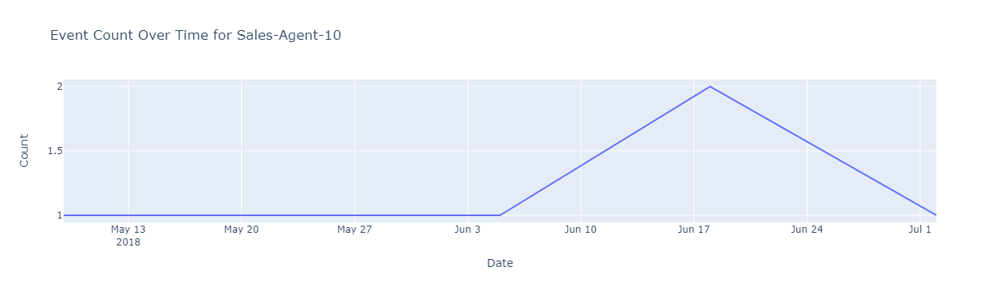

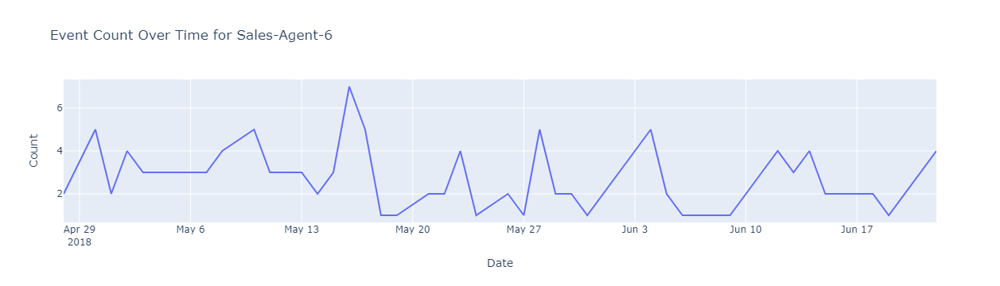

In [48]:
# Extract date from 'Created' column
df['Date'] = df['Created'].dt.date

# replacing empty string of Sales agent with null values
df.Sales_Agent.replace('',np.nan,inplace=True)

# Handling Sales agent in df_C
df['Sales_Agent'].fillna("Sales-Agent-4",inplace=True)

# Get unique sales agents
agents = df['Sales_Agent'].unique()

# Create a line plot for each sales agent
for agent in agents:
    agent_data = df[df['Sales_Agent'] == agent]
    agent_data_count = agent_data.groupby('Date').size().reset_index(name='Count')
    fig = px.line(agent_data_count, x='Date', y='Count', title=f'Event Count Over Time for {agent}')
    fig.show()

## Insight
- Most of the agents are showing a high progress
- Some agents are so low performance such as sales agent 1 

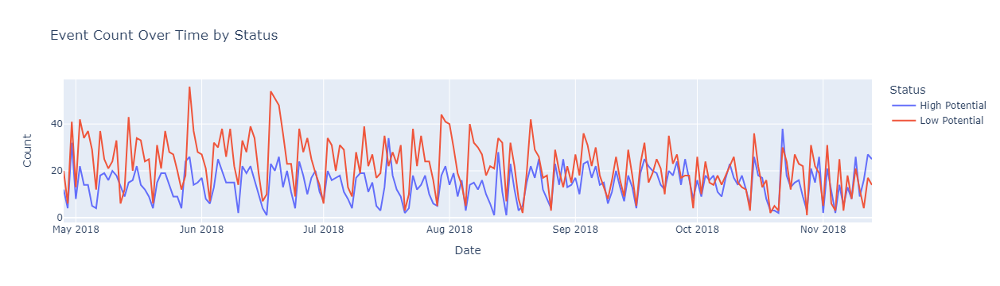

In [49]:
# replacing the status for the change of duplicated dataframe for time forecasting
df.Status.replace(['CONVERTED','converted','In Progress Positive','Potential','Long Term','Open','Just Enquiry'],'High Potential',inplace=True)
df.Status.replace(['LOST','In Progress Negative','Not Responding','Junk Lead'],'Low Potential',inplace=True)

# Extract date from 'Created' column
df['Date'] = df['Created'].dt.date

# Aggregate data by date and status
status_counts = df.groupby(['Date', 'Status']).size().reset_index(name='Count')

# Plot using Plotly Express
fig = px.line(status_counts, x='Date', y='Count', color='Status',
              title='Event Count Over Time by Status')
fig.show()

## INSIGHT
- The plot gives such improvement in the potential 
- For the first 3 months, it was low potential but afterwards it becomes high potential

# Multivariate Analysis

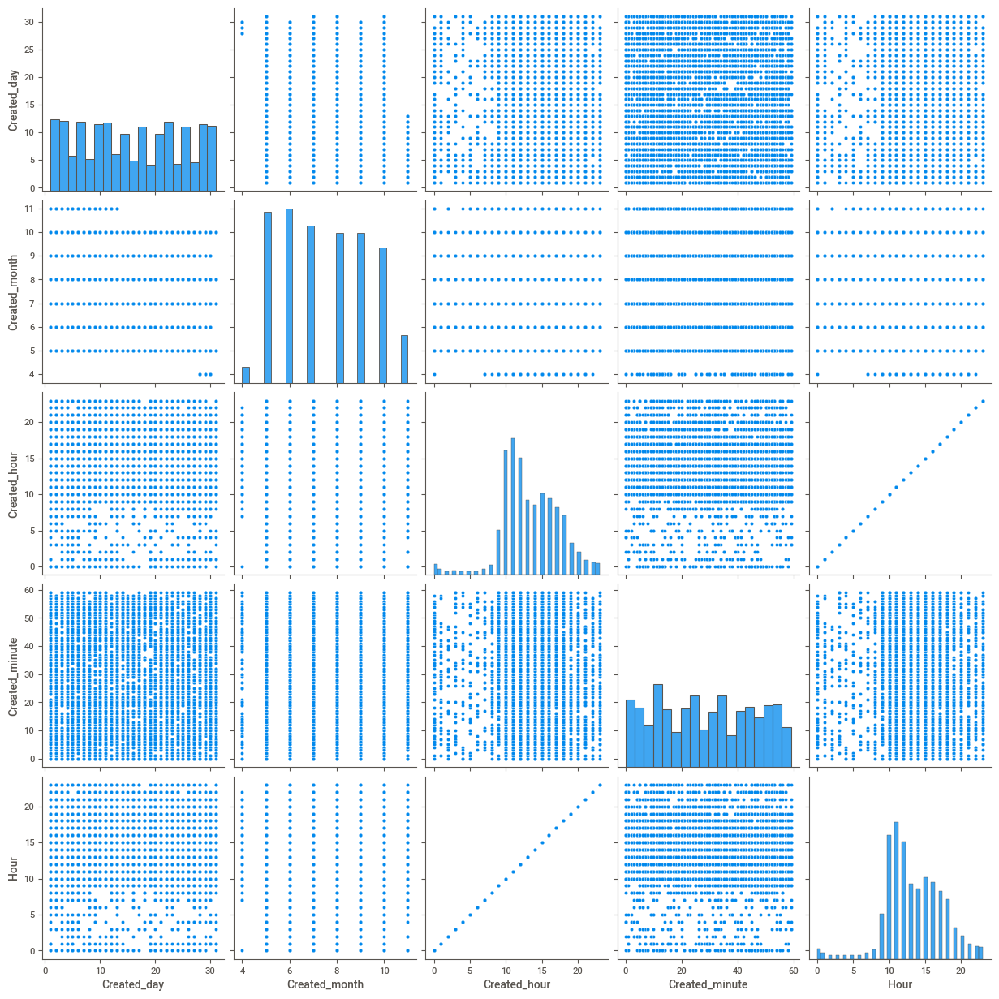

In [50]:
sns.pairplot(df)

In [51]:
df.drop(['Created','Date'],axis = 1,inplace = True)

# Data Preprocessing

In [52]:
df

,Product_ID,Source,Sales_Agent,Location,Delivery_Mode,Status,Created_day,Created_month,Created_hour,Created_minute,Hour
18,9,Live Chat-Google Organic,Sales-Agent-3,Bangalore,Mode-1,High Potential,13,11,18,51,18
19,19,Call,Sales-Agent-4,Other Locations,Mode-5,High Potential,13,11,18,48,18
24,18,Website,Sales-Agent-11,Trivandrum,Mode-1,High Potential,13,11,17,9,17
25,15,Website,Sales-Agent-7,Hyderabad,Mode-1,Low Potential,13,11,16,49,16
26,18,Call,Sales-Agent-7,Bangalore,Mode-1,High Potential,13,11,16,37,16
...,...,...,...,...,...,...,...,...,...,...,...
7417,9,Call,Sales-Agent-6,Mumbai,Mode-4,Low Potential,28,4,9,45,9
7418,15,Call,Sales-Agent-12,Other Locations,Mode-5,Low Potential,28,4,9,43,9
7419,5,Live Chat-Direct,Sales-Agent-11,Bangalore,Mode-1,Low Potential,28,4,9,20,9
7420,21,CRM form,Sales-Agent-4,Other Locations,Mode-1,Low Potential,28,4,8,4,8


In [53]:
df.dtypes

Product_ID        object
Source            object
Sales_Agent       object
Location          object
Delivery_Mode     object
Status            object
Created_day        int64
Created_month      int64
Created_hour       int64
Created_minute     int64
Hour               int32
dtype: object

In [54]:
features = ['Product_ID','Source', 'Sales_Agent', 'Location', 'Delivery_Mode']

In [55]:
target = 'Status'

In [56]:
X = df[features]

In [57]:
X.reset_index(drop=True,inplace=True)

In [58]:
y = df[target]

In [59]:
y.reset_index(drop=True,inplace=True)

In [60]:
y

0       High Potential
1       High Potential
2       High Potential
3        Low Potential
4       High Potential
             ...      
7323     Low Potential
7324     Low Potential
7325     Low Potential
7326     Low Potential
7327    High Potential
Name: Status, Length: 7328, dtype: object

In [61]:
y = (y=='High Potential').astype('int')  #high potential will become true other will be false

# Train Test Split

In [62]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=5,stratify=y)

In [63]:
X_train

,Product_ID,Source,Sales_Agent,Location,Delivery_Mode
6736,5,Live Chat-Direct,Sales-Agent-11,Other Locations,Mode-1
5746,10,Call,Sales-Agent-11,Hyderabad,Mode-3
922,19,Call,Sales-Agent-4,Bangalore,Mode-5
5757,9,Personal Contact,Sales-Agent-9,Bangalore,Mode-1
482,19,Call,Sales-Agent-7,Bangalore,Mode-4
...,...,...,...,...,...
2464,19,Live Chat-Direct,Sales-Agent-9,Bangalore,Mode-1
2556,18,Call,Sales-Agent-4,Chennai,Mode-5
745,18,Website,Sales-Agent-3,Mumbai,Mode-5
2345,15,Call,Sales-Agent-4,Other Locations,Mode-5


In [64]:
X_test

,Product_ID,Source,Sales_Agent,Location,Delivery_Mode
631,18,Call,Sales-Agent-3,Chennai,Mode-1
5913,27,Call,Sales-Agent-3,Chennai,Mode-1
2829,19,Live Chat-Direct,Sales-Agent-8,Chennai,Mode-5
4985,15,Call,Sales-Agent-4,Other Locations,Mode-5
2376,9,Call,Sales-Agent-9,Delhi,Mode-3
...,...,...,...,...,...
6067,9,Website,Sales-Agent-3,Other Locations,Mode-1
6697,15,Call,Sales-Agent-2,Other Locations,Mode-5
5400,9,Live Chat-Direct,Sales-Agent-4,Mumbai,Mode-3
6372,18,Live Chat-Direct,Sales-Agent-3,Bangalore,Mode-1


In [65]:
y_train

6736    0
5746    0
922     1
5757    1
482     1
       ..
2464    1
2556    0
745     0
2345    0
3195    0
Name: Status, Length: 5862, dtype: int32

In [66]:
y_test

631     1
5913    0
2829    1
4985    0
2376    1
       ..
6067    1
6697    0
5400    0
6372    1
1850    0
Name: Status, Length: 1466, dtype: int32

# One Hot Encoding

In [67]:
ohe = OneHotEncoder(drop='if_binary', handle_unknown='ignore', sparse_output=False)

In [68]:
ohe.fit(X_train)

OneHotEncoder(drop='if_binary', handle_unknown='ignore', sparse_output=False)

In [69]:
X_train_ohe = pd.DataFrame(data=ohe.transform(X_train),columns=ohe.get_feature_names_out())

In [70]:
X_test_ohe = pd.DataFrame(data=ohe.transform(X_test),columns=ohe.get_feature_names_out())

In [71]:
X_train_ohe

,Product_ID_0,Product_ID_1,Product_ID_10,Product_ID_11,Product_ID_12,Product_ID_13,Product_ID_14,Product_ID_15,Product_ID_16,Product_ID_17,...,Location_Singapore,Location_Trivandrum,Location_UAE,Location_UK,Location_USA,Delivery_Mode_Mode-1,Delivery_Mode_Mode-2,Delivery_Mode_Mode-3,Delivery_Mode_Mode-4,Delivery_Mode_Mode-5
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5857,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
5858,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5859,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5860,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [72]:
X_test_ohe

,Product_ID_0,Product_ID_1,Product_ID_10,Product_ID_11,Product_ID_12,Product_ID_13,Product_ID_14,Product_ID_15,Product_ID_16,Product_ID_17,...,Location_Singapore,Location_Trivandrum,Location_UAE,Location_UK,Location_USA,Delivery_Mode_Mode-1,Delivery_Mode_Mode-2,Delivery_Mode_Mode-3,Delivery_Mode_Mode-4,Delivery_Mode_Mode-5
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1461,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1462,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1463,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1464,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


# Modeling

# 1. Random Forest Classifier

In [73]:
y_train.value_counts()

Status
0    3573
1    2289
Name: count, dtype: int64

In [74]:
rfc = RandomForestClassifier(n_estimators=400,max_depth=14, criterion='gini',min_samples_split=6,min_samples_leaf=6, n_jobs=-1,class_weight='balanced',min_impurity_decrease=1e-9,random_state=5)

In [75]:
rfc.fit(X_train_ohe,y_train)

RandomForestClassifier(class_weight='balanced', max_depth=14,
                       min_impurity_decrease=1e-09, min_samples_leaf=6,
                       min_samples_split=6, n_estimators=400, n_jobs=-1,
                       random_state=5)

In [76]:
y_pred_train = rfc.predict(X_train_ohe)

In [77]:
y_pred_test = rfc.predict(X_test_ohe)

In [78]:
y_pred_test.shape

(1466,)

# Feature Importance

In [79]:
feat_imp = pd.DataFrame(data=rfc.feature_importances_,index=rfc.feature_names_in_,columns=['importance'])

In [80]:
feat_imp.sort_values('importance',ascending=False)

,importance
Product_ID_15,0.226177
Location_Other Locations,0.152504
Location_Bangalore,0.111493
Delivery_Mode_Mode-5,0.056258
Sales_Agent_Sales-Agent-9,0.048717
...,...
Product_ID_17,0.000000
Source_Live Chat-Quora,0.000000
Source_Other,0.000000
Source_SMS Campaign,0.000000


# Evaluation

## Train

In [81]:
accuracy_score(y_train,y_pred_train)

0.7291026953258274

In [82]:
f1_score(y_train,y_pred_train)

0.6972931757529547

In [83]:
precision_score(y_train,y_pred_train)

0.6185322962461954

In [84]:
recall_score(y_train,y_pred_train)

0.799038881607689

## Test

In [85]:
accuracy_score(y_test,y_pred_test)

0.6930422919508867

In [86]:
f1_score(y_test,y_pred_test)

0.6621621621621622

In [87]:
precision_score(y_test,y_pred_test)

0.5810276679841897

In [88]:
recall_score(y_test,y_pred_test)

0.7696335078534031

## 2. Decision Tree Classifier

In [89]:
dtree = DecisionTreeClassifier()

In [90]:
dtree.fit(X_train_ohe,y_train)

DecisionTreeClassifier()

In [91]:
y_pred_train = dtree.predict(X_train_ohe)

In [92]:
y_pred_test = dtree.predict(X_test_ohe)

In [93]:
y_test

631     1
5913    0
2829    1
4985    0
2376    1
       ..
6067    1
6697    0
5400    0
6372    1
1850    0
Name: Status, Length: 1466, dtype: int32

# Feature Importance

In [94]:
feat_imp = pd.DataFrame(data=dtree.feature_importances_,index=dtree.feature_names_in_,columns=['importance'])

In [95]:
feat_imp.sort_values('importance',ascending=False)

,importance
Product_ID_15,0.191221
Location_Bangalore,0.064219
Source_Call,0.036780
Source_Live Chat-Direct,0.035793
Sales_Agent_Sales-Agent-9,0.031652
...,...
Source_Live Chat-Quora,0.000000
Product_ID_7,0.000000
Product_ID_28,0.000000
Product_ID_24,0.000000


# Evaluation

## Train

In [96]:
accuracy_score(y_train,y_pred_train)

0.8597748208802457

In [97]:
f1_score(y_train,y_pred_train)

0.8083916083916084

In [98]:
roc_auc_score(y_train,y_pred_train)

0.8414044609362706

In [99]:
precision_score(y_train,y_pred_train)

0.8665667166416792

In [100]:
recall_score(y_train,y_pred_train)

0.7575360419397117

## Test

In [101]:
accuracy_score(y_test,y_pred_test)

0.6828103683492497

In [102]:
f1_score(y_test,y_pred_test)

0.5784224841341795

In [103]:
roc_auc_score(y_test,y_pred_test)

0.6602184139193924

In [104]:
precision_score(y_test,y_pred_test)

0.6018867924528302

In [105]:
recall_score(y_test,y_pred_test)

0.5567190226876091

## 3. XGBoost Classifier

In [106]:
XG = XGBClassifier(n_estimators=1000,learning_rate=0.1,max_depth=60,min_child_weight=5,gamma=6,reg_alpha=40,subsample=0.9,colsample_bytree=0.8,objective='binary:logistic',nthread=-1,scale_pos_weight=(1/y.mean()-1),seed=27,n_jobs=-1)

In [107]:
XG.fit(X_train_ohe,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=6, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=60, max_leaves=None,
              min_child_weight=5, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=1000, n_jobs=-1, nthread=-1,
              num_parallel_tree=None, ...)

In [108]:
y_pred_train = XG.predict(X_train_ohe)

In [109]:
y_pred_test = XG.predict(X_test_ohe)

## Feature Importance

In [110]:
feat_imp = pd.DataFrame(data=XG.feature_importances_,index=XG.feature_names_in_,columns=['importance'])

In [111]:
feat_imp.sort_values('importance',ascending=False)

,importance
Product_ID_15,0.285710
Location_Bangalore,0.087120
Location_Other Locations,0.083023
Product_ID_27,0.042344
Product_ID_9,0.035973
...,...
Source_Live Chat-Quora,0.000000
Source_Other,0.000000
Source_Personal Contact,0.000000
Source_SMS Campaign,0.000000


# Evaluation

## Train

In [112]:
accuracy_score(y_train,y_pred_train)

0.6757079495052883

In [113]:
f1_score(y_train,y_pred_train)

0.6527853881278538

In [114]:
roc_auc_score(y_train,y_pred_train)

0.6945712693754198

In [115]:
precision_score(y_train,y_pred_train)

0.5608913998744507

In [116]:
recall_score(y_train,y_pred_train)

0.780690257754478

## Test

In [117]:
accuracy_score(y_test,y_pred_test)

0.669849931787176

In [118]:
f1_score(y_test,y_pred_test)

0.6527977044476327

In [119]:
roc_auc_score(y_test,y_pred_test)

0.6921059471671269

In [120]:
precision_score(y_test,y_pred_test)

0.5542021924482339

In [121]:
recall_score(y_test,y_pred_test)

0.794066317626527

# 4. Logistic Regression

In [122]:
lr = LogisticRegression(max_iter=1000)

In [123]:
lr.fit(X_train_ohe,y_train)

LogisticRegression(max_iter=1000)

In [124]:
y_pred_train = lr.predict(X_train_ohe)

In [125]:
y_pred_test = lr.predict(X_test_ohe)

In [126]:
coefficients = lr.coef_

In [127]:
avg_importance = np.mean(np.abs(coefficients), axis=0)

In [128]:
coefficients

array([[-0.60538246, -0.90384451,  0.8361152 ,  0.3184072 , -0.08282025,
        -0.61246925, -1.32967549, -1.48657398, -0.59129793, -0.15685535,
         0.79476579,  1.01382824,  0.44486883,  0.96076508,  0.58500791,
        -0.73440245, -0.49579441, -0.28681732,  0.21909991,  0.41759517,
         0.71483859, -0.3410825 ,  0.91702731, -0.03605232, -0.02915787,
        -0.29457686,  0.125872  ,  0.6073731 ,  1.23445588, -0.4939944 ,
         0.06026381, -0.0782978 ,  1.70004337, -0.62978764,  2.36656112,
         1.5427788 , -1.15775193, -0.51355248,  0.03057084, -0.63699317,
        -0.28157474, -0.43863568, -1.36104767, -0.44629061,  0.38072874,
        -0.27821663,  0.58912098,  0.00801451, -1.39537184, -0.23226208,
        -0.55474236,  0.26680373, -1.11000642, -0.02185205, -0.5232102 ,
         0.18884039, -0.37592601, -0.07323033,  0.08277752,  1.32300012,
         0.766307  , -0.17993025,  0.65330998,  0.21538641, -0.51533358,
         0.78033952, -0.2289222 , -0.72983198,  0.8

## Feature Importance

In [129]:
feature_importance = pd.DataFrame(index=X_train_ohe.columns,data=avg_importance,columns=['importance'])

In [130]:
feature_importance.sort_values('importance',ascending=False)

,importance
Source_Existing Client,2.366561
Source_Customer Referral,1.700043
Source_Existing Customer,1.542779
Product_ID_15,1.486574
Source_US Website,1.395372
...,...
Source_Live Chat-Adwords Remarketing,0.030571
Product_ID_6,0.029158
Sales_Agent_Sales-Agent-2,0.021852
Delivery_Mode_Mode-3,0.016337


# Evaluation

## Train

In [131]:
accuracy_score(y_train,y_pred_train)

0.7258614807233026

In [132]:
f1_score(y_train,y_pred_train)

0.6263659614043245

In [133]:
roc_auc_score(y_train,y_pred_train)

0.7011742356299008

In [134]:
precision_score(y_train,y_pred_train)

0.6694831013916501

In [135]:
recall_score(y_train,y_pred_train)

0.5884665792922673

## Test

In [136]:
accuracy_score(y_test,y_pred_test)

0.7141882673942701

In [137]:
f1_score(y_test,y_pred_test)

0.6109563602599813

In [138]:
roc_auc_score(y_test,y_pred_test)

0.6891011923258074

In [139]:
precision_score(y_test,y_pred_test)

0.6527777777777778

In [140]:
recall_score(y_test,y_pred_test)

0.5741710296684118

# 5.SVM

In [141]:
svm = SVC(max_iter=2000)

In [142]:
svm.fit(X_train_ohe,y_train)

SVC(max_iter=2000)

In [143]:
y_pred_train = svm.predict(X_train_ohe)

In [144]:
y_pred_test = svm.predict(X_test_ohe)

# Evaluation

## Train

In [145]:
accuracy_score(y_train,y_pred_train)

0.7756738314568407

In [146]:
f1_score(y_train,y_pred_train)

0.681675139191479

In [147]:
roc_auc_score(y_train,y_pred_train)

0.7468246081815743

In [148]:
precision_score(y_train,y_pred_train)

0.7643865363735071

In [149]:
recall_score(y_train,y_pred_train)

0.6151157710790738

## Test

In [150]:
accuracy_score(y_test,y_pred_test)

0.7196452933151433

In [151]:
f1_score(y_test,y_pred_test)

0.6013579049466539

In [152]:
roc_auc_score(y_test,y_pred_test)

0.6876393668810548

In [153]:
precision_score(y_test,y_pred_test)

0.6768558951965066

In [154]:
recall_score(y_test,y_pred_test)

0.5410122164048866

# 6. KNN

In [155]:
neigh = KNeighborsClassifier(n_neighbors=3)

In [156]:
 neigh.fit(X_train_ohe,y_train)

KNeighborsClassifier(n_neighbors=3)

In [157]:
y_pred_train = neigh.predict(X_train_ohe)

In [158]:
y_pred_test = neigh.predict(X_test_ohe)

# Evaluation

## Train

In [159]:
accuracy_score(y_train,y_pred_train)

0.7951211190719891

In [160]:
f1_score(y_train,y_pred_train)

0.7331704065763163

In [161]:
roc_auc_score(y_train,y_pred_train)

0.7817740010908962

In [162]:
precision_score(y_train,y_pred_train)

0.7459312839059674

In [163]:
recall_score(y_train,y_pred_train)

0.7208387942332897

## Test

In [164]:
accuracy_score(y_test,y_pred_test)

0.6718963165075034

In [165]:
f1_score(y_test,y_pred_test)

0.5899403239556692

In [166]:
roc_auc_score(y_test,y_pred_test)

0.6597024755271268

In [167]:
precision_score(y_test,y_pred_test)

0.5766666666666667

In [168]:
recall_score(y_test,y_pred_test)

0.6038394415357766

# Hyperparameter Tuning for Random Forest

In [169]:
param_grid = {
    'bootstrap': [True],
    'max_depth': [i for i in range(8,12)],
    'max_features': [i for i in range(4,13,2)],
    'n_estimators': [400, 200, 300, 1000]
}

In [170]:
rf = RandomForestClassifier(n_jobs=-1,class_weight='balanced')

In [171]:
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3,n_jobs = 1, verbose = 10)

In [172]:
grid_search.fit(X_train_ohe,y_train)

Fitting 3 folds for each of 80 candidates, totalling 240 fits
[CV 1/3; 1/80] START bootstrap=True, max_depth=8, max_features=4, n_estimators=400
[CV 1/3; 1/80] END bootstrap=True, max_depth=8, max_features=4, n_estimators=400;, score=0.693 total time=   0.8s
[CV 2/3; 1/80] START bootstrap=True, max_depth=8, max_features=4, n_estimators=400
[CV 2/3; 1/80] END bootstrap=True, max_depth=8, max_features=4, n_estimators=400;, score=0.677 total time=   0.8s
[CV 3/3; 1/80] START bootstrap=True, max_depth=8, max_features=4, n_estimators=400
[CV 3/3; 1/80] END bootstrap=True, max_depth=8, max_features=4, n_estimators=400;, score=0.664 total time=   0.8s
[CV 1/3; 2/80] START bootstrap=True, max_depth=8, max_features=4, n_estimators=200
[CV 1/3; 2/80] END bootstrap=True, max_depth=8, max_features=4, n_estimators=200;, score=0.695 total time=   0.4s
[CV 2/3; 2/80] START bootstrap=True, max_depth=8, max_features=4, n_estimators=200
[CV 2/3; 2/80] END bootstrap=True, max_depth=8, max_features=4, n_e

GridSearchCV(cv=3,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              n_jobs=-1),
             n_jobs=1,
             param_grid={'bootstrap': [True], 'max_depth': [8, 9, 10, 11],
                         'max_features': [4, 6, 8, 10, 12],
                         'n_estimators': [400, 200, 300, 1000]},
             verbose=10)

In [173]:
best_grid = grid_search.best_estimator_

In [174]:
grid_search.best_params_

{'bootstrap': True, 'max_depth': 10, 'max_features': 12, 'n_estimators': 200}

In [175]:
best_grid = RandomForestClassifier(max_depth=11,max_features=10,n_estimators=200,bootstrap=True,n_jobs=-1)

In [176]:
best_grid.fit(X_train_ohe,y_train)

RandomForestClassifier(max_depth=11, max_features=10, n_estimators=200,
                       n_jobs=-1)

In [177]:
y_pred_train =  best_grid.predict(X_train_ohe)

In [178]:
y_pred_test = best_grid.predict(X_test_ohe)

# Evaluation

## Train

In [179]:
accuracy_score(y_train,y_pred_train)

0.7698737632207437

In [180]:
f1_score(y_train,y_pred_train)

0.6636748940413862

In [181]:
roc_auc_score(y_train,y_pred_train)

0.7360223886810905

In [182]:
precision_score(y_train,y_pred_train)

0.772938443670151

In [183]:
recall_score(y_train,y_pred_train)

0.581476627348187

## Test

In [185]:
accuracy_score(y_test,y_pred_test)

0.7148703956343793

In [186]:
f1_score(y_test,y_pred_test)

0.5869565217391305

In [187]:
roc_auc_score(y_test,y_pred_test)

0.6796550248295352

In [188]:
precision_score(y_test,y_pred_test)

0.6765375854214123

In [189]:
recall_score(y_test,y_pred_test)

0.518324607329843